## Steps for this Project

- Camera Calibration
- Color/Gradient Threshold
- Perspective Transform

In [2]:
#import necessary dependencies
import numpy as np
import cv2
import matplotlib.pyplot as plt
import glob
import pickle
%matplotlib inline

In [74]:
#utility function to draw input and output image
def draw_in_out(frame, out, in_gray= False, out_gray = False):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))
    f.tight_layout()
    if in_gray:
        ax2.imshow(frame, cmap='gray')
    else:
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        ax2.imshow(frame)
    ax1.imshow(frame)
    ax1.set_title('Input Image', fontsize=30)
    if out_gray:
        ax2.imshow(out, cmap='gray')
    else:
        out = cv2.cvtColor(out, cv2.COLOR_BGR2RGB)
        ax2.imshow(out)
    ax2.set_title('Output Image', fontsize=30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [36]:
#simple decorator to draw input and output of a function
def visualize_function(func):
    def inner(*args, **kwargs):
        #first argument must be an image
        output = func(*args, **kwargs)
        if output is not None:
            draw_in_out(cv2.cvtColor(args[1], cv2.COLOR_BGR2RGB), cv2.cvtColor(output, cv2.COLOR_BGR2RGB))  #if calling directly/without class use, *args instead
        
    return inner
        

In [37]:
# @visualize_function
def calibrateCamera(img):
    # find corners
    frame = img.copy()
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray , (9, 6), None)
    print(ret)
    out = cv2.drawChessboardCorners(frame, (9, 6), corners, ret)
   
    return out
    

In [38]:
img= cv2.imread("camera_cal/calibration1.jpg")
calibrateCamera(img)

False


array([[[234, 233, 237],
        [235, 234, 238],
        [195, 198, 202],
        ...,
        [150, 126,  80],
        [166, 141,  91],
        [192, 165, 114]],

       [[233, 232, 236],
        [186, 187, 191],
        [146, 149, 153],
        ...,
        [217, 204, 172],
        [180, 166, 130],
        [132, 119,  81]],

       [[199, 200, 204],
        [144, 145, 149],
        [190, 193, 197],
        ...,
        [228, 231, 216],
        [217, 218, 202],
        [174, 176, 157]],

       ...,

       [[ 15,  20,  23],
        [134, 139, 142],
        [198, 205, 208],
        ...,
        [193, 205, 207],
        [189, 201, 203],
        [195, 207, 209]],

       [[ 12,  17,  20],
        [ 86,  91,  94],
        [198, 205, 208],
        ...,
        [185, 197, 199],
        [191, 203, 205],
        [191, 203, 205]],

       [[ 17,  22,  23],
        [  9,  14,  17],
        [111, 118, 121],
        ...,
        [188, 200, 202],
        [189, 201, 203],
        [104, 116, 118]]

In [39]:
class CameraCalibrator:
    def __init__(self):
        """
            
        """
        
        self.obj_points = []
        self.img_points = []
        self.objp = np.zeros((6 * 9, 3), np.float32)
        self.objp[:, :2] = np.mgrid[0:9, 0:6].T.reshape(-1, 2)
        self.first = True
        self.shape = None
        self.c = 0
        
    @visualize_function
    def calibrate(self, img, single=False):
        """
            Args:
                Frame (np.ndarray) : input frame to apply calibration on
            
            Returns:
                Frame (np.ndarray) : output frame with calibration applied
                
        """
        frame = img.copy()
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        ret_c, corners = cv2.findChessboardCorners(gray , (9, 6), None)
        if self.first:
            self.shape = gray.shape[::-1]
            self.first = False
        
        if single:  #if single image/direct call to this func
            ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(self.obj_points, self.img_points, gry.shape[::-1], None, None)
            return mtx, dist
        else:
            if ret_c: #if found corenrs
                self.c += 1
                self.obj_points.append(self.objp)
                self.img_points.append(corners)
                return cv2.drawChessboardCorners(frame, (9, 6), corners, ret_c)
    
        
    
    def run_calibration(self, input_dir):
        file_names = glob.glob(input_dir + "*.jpg")
        for name in file_names:
            print('Processing %s' % (name))
            img = cv2.imread(name)
            out = self.calibrate(img)
        print("Found corners in {} images out of {} images".format(self.c, len(file_names)))
        self.c = 0
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(self.obj_points, self.img_points, self.shape, None, None)
        self.mtx = mtx
        self.dist = dist
    
    @visualize_function
    def undistort(self, frame):
        undistorted = cv2.undistort(frame, self.mtx, self.dist, None, self.mtx)
        return undistorted
    
    def read_and_undistort(self, path):
        img = cv2.imread(path)
        out = self.undistort(img)
        return out
    
    def save_params(self, fname):
        d = {'mtx':self.mtx, 'dist':self.dist}
        with open(fname, 'wb') as f:
            pickle.dump(d, f)
            
    def load_params(self, fname):
        with open(fname, 'rb') as f:
            d = pickle.load(f)
            self.mtx = d['mtx']
            self.dist = d['dist']
    
    
        
        

Processing camera_cal\calibration1.jpg
Processing camera_cal\calibration10.jpg
Processing camera_cal\calibration11.jpg
Processing camera_cal\calibration12.jpg
Processing camera_cal\calibration13.jpg
Processing camera_cal\calibration14.jpg
Processing camera_cal\calibration15.jpg
Processing camera_cal\calibration16.jpg
Processing camera_cal\calibration17.jpg
Processing camera_cal\calibration18.jpg
Processing camera_cal\calibration19.jpg
Processing camera_cal\calibration2.jpg
Processing camera_cal\calibration20.jpg
Processing camera_cal\calibration3.jpg
Processing camera_cal\calibration4.jpg
Processing camera_cal\calibration5.jpg
Processing camera_cal\calibration6.jpg
Processing camera_cal\calibration7.jpg
Processing camera_cal\calibration8.jpg
Processing camera_cal\calibration9.jpg
Found corners in 17 images out of 20 images


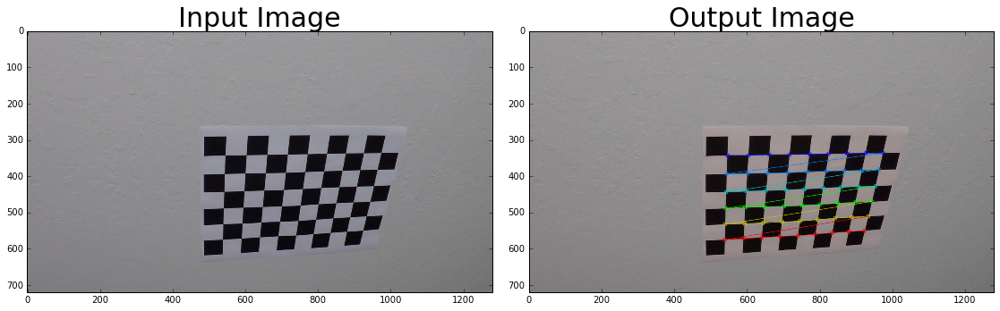

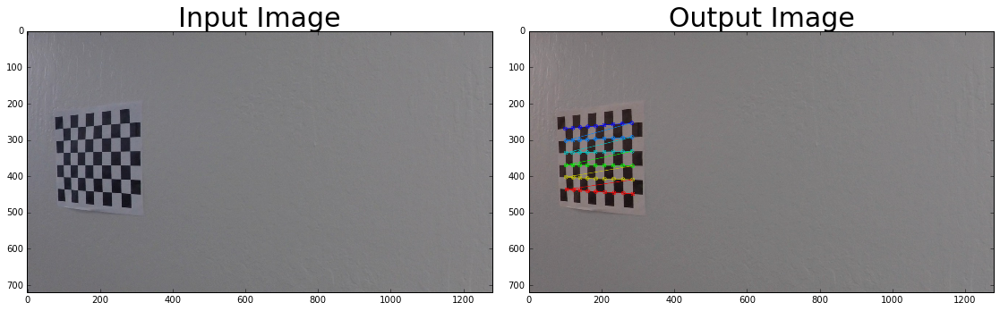

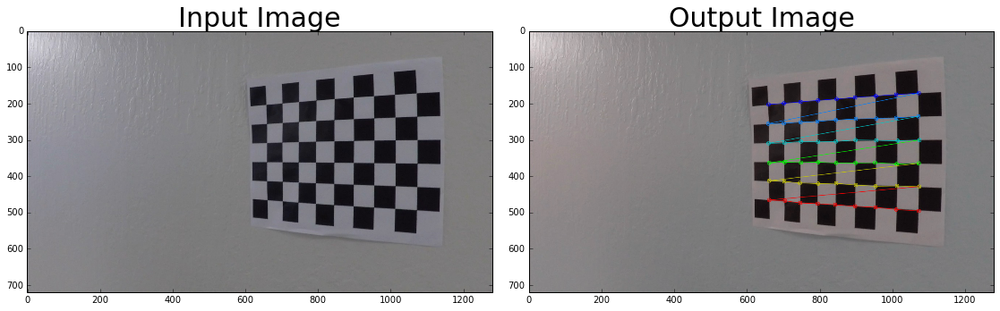

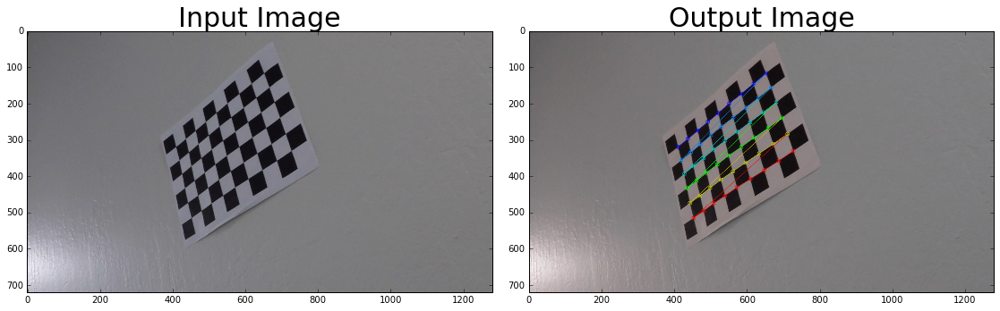

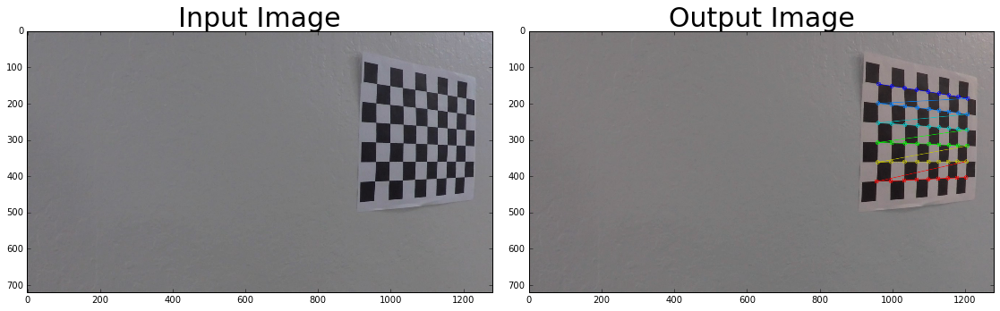

...

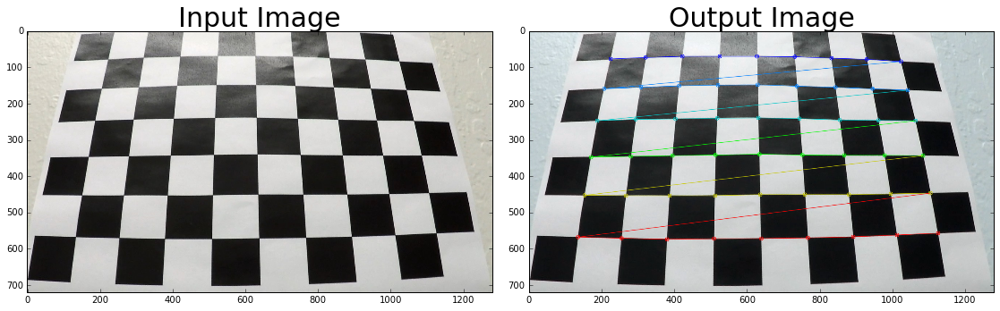

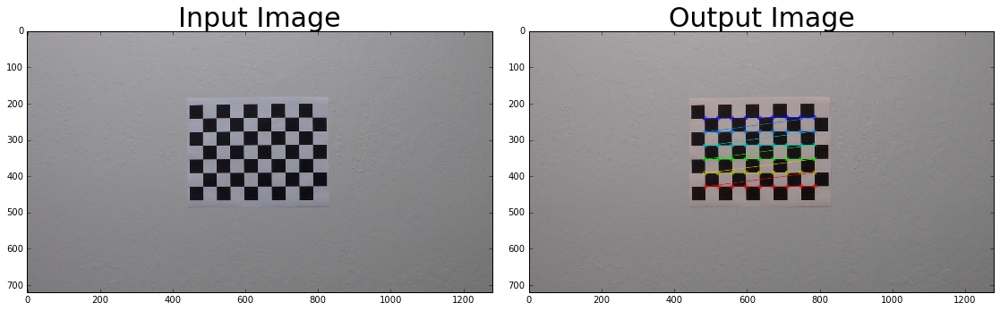

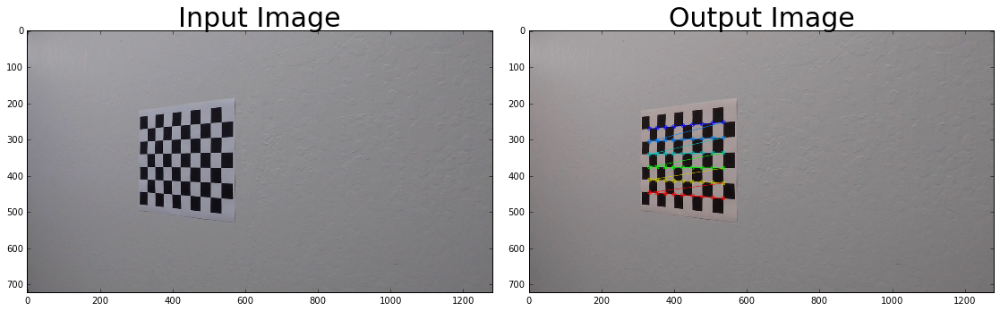

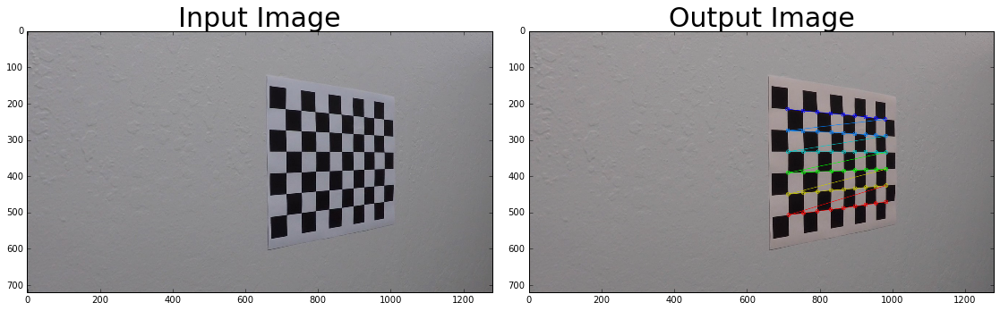

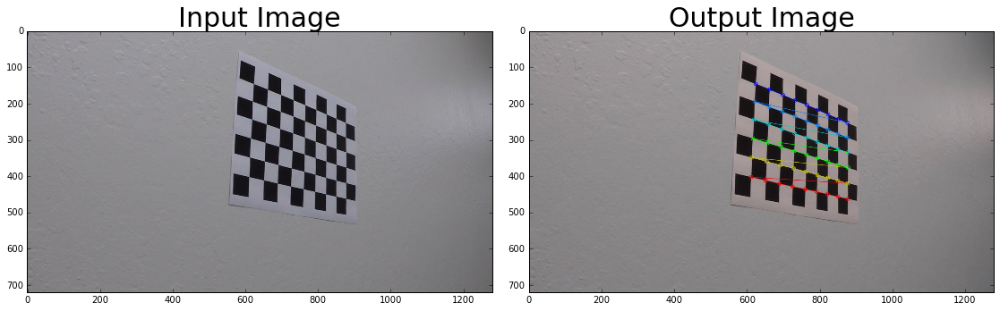

In [40]:
ob = CameraCalibrator()
ob.run_calibration("camera_cal/")

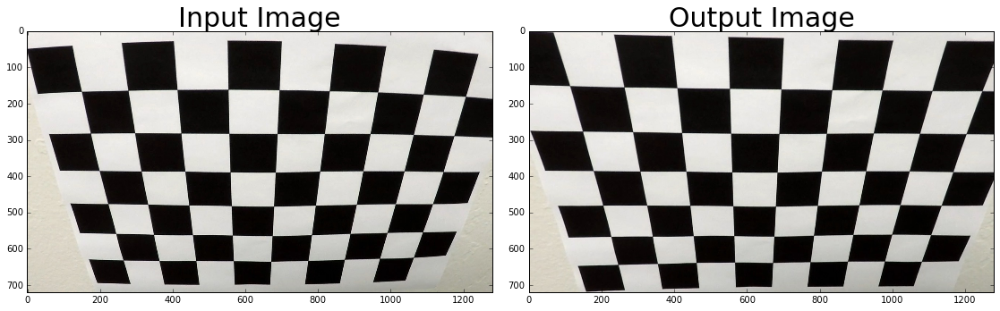

In [101]:
#undistort images
ob.read_and_undistort("camera_cal/calibration2.jpg")

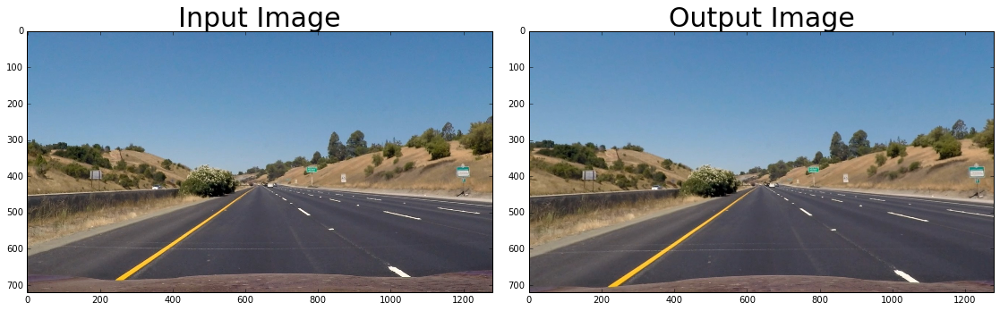

In [102]:
#lets try this on road image
ob.read_and_undistort("test_images/straight_lines1.jpg")

In [114]:
ob.save_params("camera_params.pickle") #save params for future runs

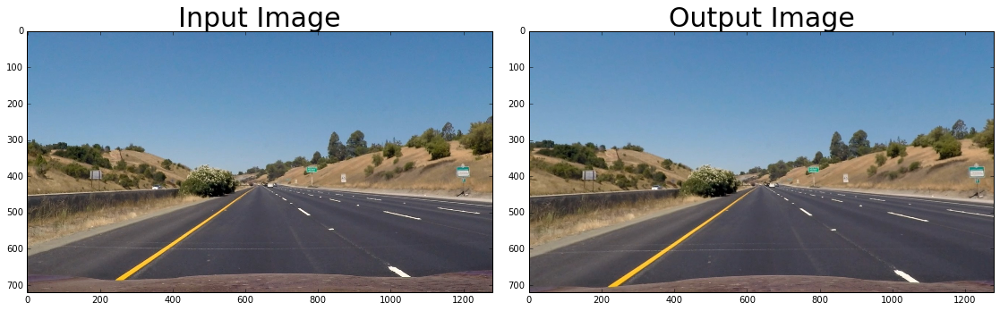

In [113]:
obj = CameraCalibrator()
obj.load_params("camera_params.pickle")
obj.read_and_undistort("test_images/straight_lines1.jpg")

## Perspective Transform

In [85]:
class PerspTransform:
    def __init__(self):
#         self.src = np.float32([[self.width, self.height-10],[0, self.height-10],[546, 460],  [732, 460]])
#         self.dst = np.float32([[self.width, self.height],[0, self.height],[0, 0], [self.width, 0]])
        pass

    def plot_src(self, imgname):
        img = cv2.imread(imgname)
        self.height, self.width = img.shape[:2]
        print(self.height, self.width)
        src = np.float32([[self.width, self.height-10],[0, self.height-10],[540, 460],  [730, 460]])
        dst = np.float32([[self.width, self.height],[0, self.height],[0, 0], [self.width, 0]])
        self.plot_rectangle(img, src)
#         self.plot_rectangle(img, dst)
    
    @visualize_function
    def plot_rectangle(self, img, points):
        frame = img.copy()
        cv2.polylines(frame, [np.int32(points)], True, (0,0,255), thickness =5)
        return frame
    
    @visualize_gray_both #change accordingly
    def transform(self, img):
        height,width = img.shape[:2]
        src = np.float32([[width, height],[0, height-10],[540, 460],  [740, 460]])
        dst = np.float32([[width-50, height],[60, height],[0, 0], [width+20, 0]])
        M = cv2.getPerspectiveTransform(src, dst)
        warped = cv2.warpPerspective(img, M, (width, height), flags=cv2.INTER_LINEAR)
        return warped
        
        
        
        
        

720 1280


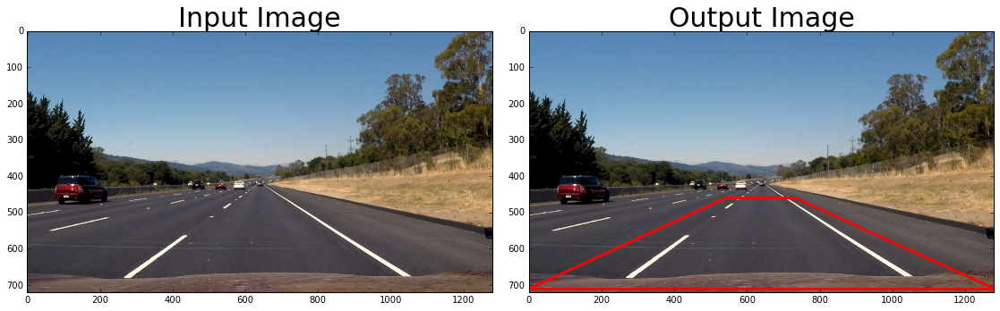

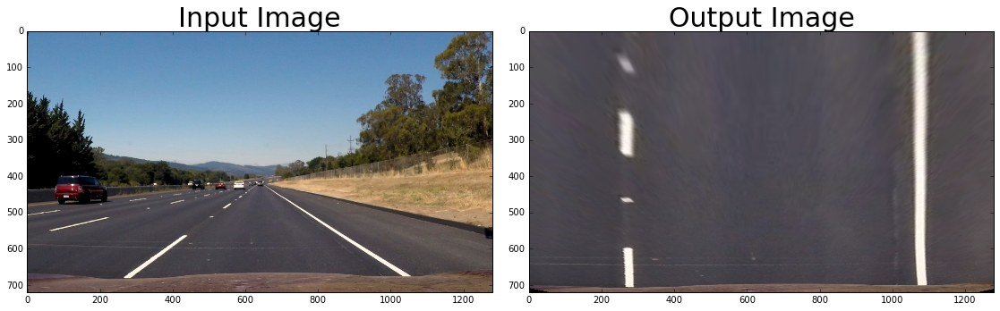

In [214]:
p = PerspTransform()
p.plot_src("test_images/straight_lines2.jpg")
img = cv2.imread("test_images/straight_lines2.jpg")
p.transform(img)

## Color/Gradient Thresholding

In [81]:


def visualize_gray(func):
    def inner(*args, **kwargs):
        #first argument must be an image
        output = func(*args, **kwargs)
        if output is not None:
            draw_in_out(args[1], output, out_gray=True) #if calling directly/without class use, *args instead
        return output
    return inner

def visualize_gray_both(func):
    def inner(*args, **kwargs):
        #first argument must be an image
        output = func(*args, **kwargs)
        if output is not None:
            draw_in_out(args[1], output, in_gray=True, out_gray=True) #if calling directly/without class use, *args instead
        return output
    return inner
        

In [82]:
@visualize_gray
def color_gradient(a, img):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]

    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    abs_sobelx = np.absolute(sobelx)
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    thresh_min = 20
    thresh_max = 100
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    s_thresh_min = 170
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255

    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    return combined_binary

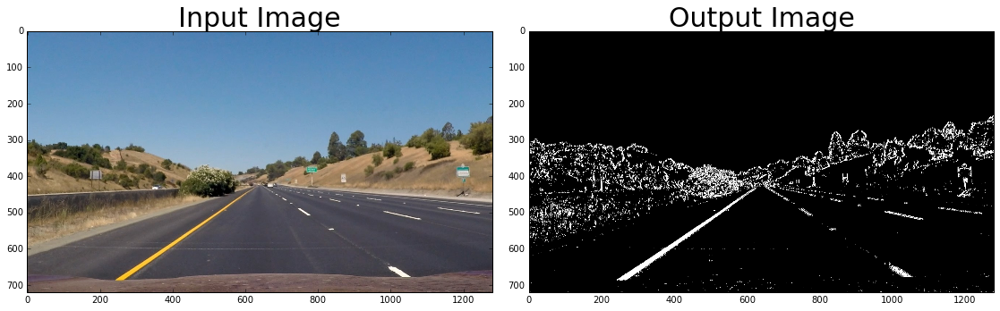

In [83]:
img = cv2.imread("test_images/straight_lines1.jpg")
out_b = color_gradient('',img)


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

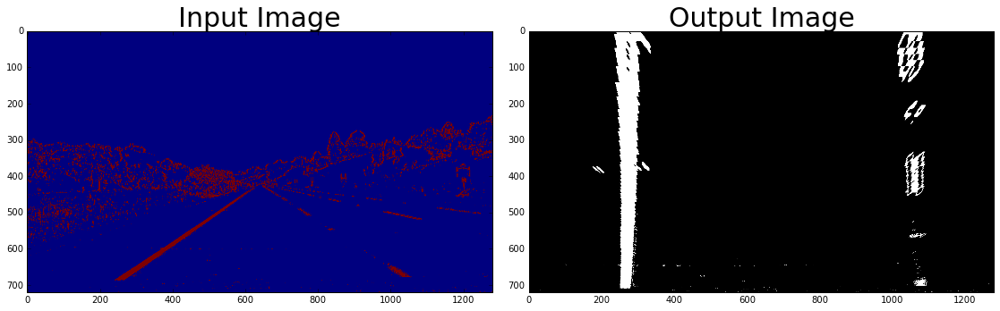

In [86]:
p = PerspTransform()
p.transform(out_b)